### Using with remote kernel

``remote_ikernel`` is installed in "bayes" conda environment 
    
    pip install remote_ikernel
    remote_ikernel --add --kernel_cmd="ipython kernel -f {connection_file}" \
    --name="nodo4" --interface=ssh --host=n4

[stackoverflow](https://stackoverflow.com/questions/29037211/how-do-i-add-a-kernel-on-a-remote-machine-in-ipython-jupyter-notebook)

In [3]:
import xarray as xr
import pandas as pd
import numpy as np
from scipy.stats import binned_statistic
import cartopy.crs as crs
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import statsmodels.api as sm
import os, imp
from fs.sshfs import SSHFS
import iris
import iris.plot as iplt
from cartopy.io import shapereader
from warnings import catch_warnings, simplefilter

era = '/sata1_glacio/glacio/Reanalysis/'

/sata1_ceazalabs/arno/HPC/n004Home/miniconda3/envs/ant/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
/sata1_ceazalabs/arno/HPC/n004Home/miniconda3/envs/ant/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The mpl_toolkits.axes_grid module was deprecated in version 2.1. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist provies the same functionality instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


In [234]:
sshfs = SSHFS('192.168.10.129', 'arno', '~/.ssh/id_rsa')

In [235]:
plots = imp.new_module('plots')
with sshfs.open('/home/arno/Documents/code/python/plots.py') as f:
    exec(f.read(), plots.__dict__)
geo = imp.new_module('geo')
with sshfs.open('/home/arno/Documents/code/python/geo.py') as f:
    exec(f.read(), geo.__dict__)

In [6]:
%matplotlib nbagg

In [100]:
from IPython.display import set_matplotlib_formats
%matplotlib inline

set_matplotlib_formats('png', 'pdf')

### GDHHG README

All data sets come in 5 different resolutions:   
	f : Full resolution.  These contain the maximum resolution
	    of this data and has not been decimated.   
	h : High resolution.  The Douglas-Peucker line reduction was
	    used to reduce data size by ~80% relative to full.   
	i : Intermediate resolution.  The Douglas-Peucker line reduction was
	    used to reduce data size by ~80% relative to high.   
	l : Low resolution.  The Douglas-Peucker line reduction was
	    used to reduce data size by ~80% relative to intermediate.   
	c : Crude resolution.  The Douglas-Peucker line reduction was
	    used to reduce data size by ~80% relative to low.   

For each resolution there are several levels; these depends on the data type.

The shoreline data are distributed in 6 levels:

Level 1: Continental land masses and ocean islands, except Antarctica.   
Level 2: Lakes   
Level 3: Islands in lakes   
Level 4: Ponds in islands within lakes   
Level 5: Antarctica based on ice front boundary.   
Level 6: Antarctica based on grounding line boundary.

Note that because GIS software confusingly seem to assume a Cartesian geometry,
any polygon straddling the Dateline is broken into an east and west component.
The most obvious example is Antarctica.

In [7]:
class sshfs_shapereader(shapereader.Reader):
    def __init__(self, path):
        self._sshfs = {k: sshfs.openbin('.'.join((path, k))) for k in ['shp', 'shx', 'dbf']}
        self._reader = Reader(**self._sshfs)
        self._geometry_factory = shapereader.GEOMETRY_FACTORIES.get(self._reader.shapeType)
        self._fields = self._reader.fields
    
    def __del__(self):
        for f in self._sshfs.values():
            f.close()

antarctica = sshfs_shapereader('/home/arno/Documents/data/geo/GSHHG/GSHHS_shp/i/GSHHS_i_L6')

In [237]:
antarctica = geo.sshfs_shapereader('/home/arno/Documents/data/geo/GSHHG/GSHHS_shp/i/GSHHS_i_L6')

NameError: name 'sshfs' is not defined

In [163]:
moistflx = xr.open_dataarray(os.path.join(era, 'ERA-moistflux-SH.nc')).sel(time=slice(None,'2016'))

In [8]:
mfm = moistflx.sel(lat=slice(-55, None)).mean('time')
mfs = moistflx.sel(lat=slice(-55, None)).std('time')
mdm = moistdiv.sel(lat=slice(-55, None)).mean('time')
mds = moistdiv.sel(lat=slice(-55, None)).std('time')

In [164]:
moistdiv = xr.open_dataarray(os.path.join(era, 'ERA-moistdiv-SH.nc')).sel(time=slice(None,'2016'))

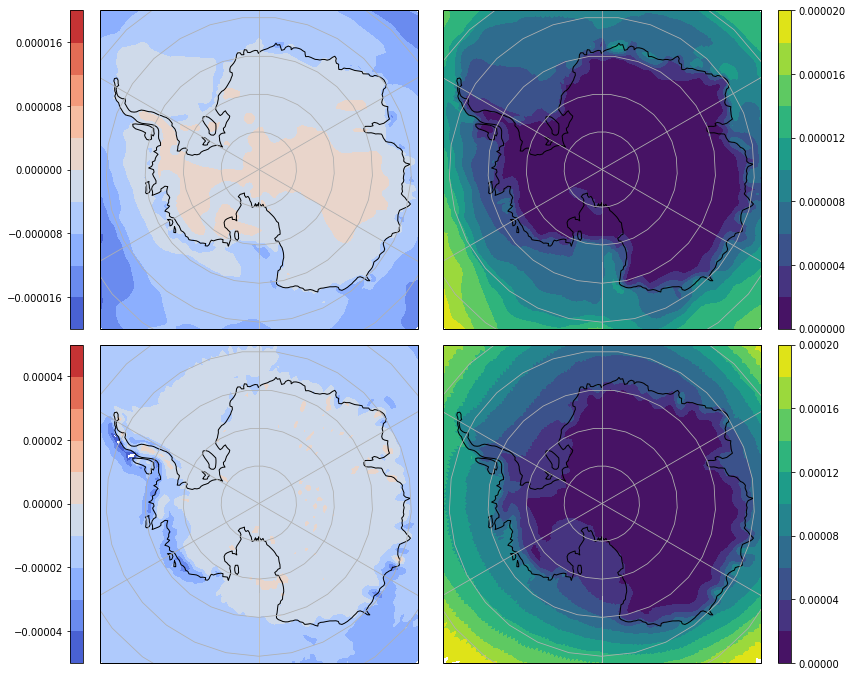

In [87]:
width = 0.015

fig, axs = plt.subplots(2, 2, figsize=(12, 12), subplot_kw={'projection': crs.SouthPolarStereo()})
fig.subplots_adjust(right=.9, wspace=.05, hspace=.05)
plt.set_cmap('coolwarm')

plots.cbar(axs[0, 0].contourf(mfm.lon, mfm.lat, mfm, np.arange(-1, 1.1, .2) * 2e-5, transform=crs.PlateCarree()),
           'left', center=True, width=width, space=width)
plots.cbar(axs[1, 0].contourf(mdm.lon, mdm.lat, mdm.squeeze(), np.arange(-1, 1.1, .2) * 5e-5, transform=crs.PlateCarree()),
           'left', center=True, width=width, space=width)

plt.set_cmap('viridis')
plots.cbar(axs[0, 1].contourf(mfs.lon, mfs.lat, mfs, np.arange(0, 1.1, .1) * 2e-5, transform=crs.PlateCarree()),
           width=width, space=width)
plots.cbar(axs[1, 1].contourf(mfs.lon, mfs.lat, mds.squeeze(), np.arange(0, 1.1, .1) * 2e-4, transform=crs.PlateCarree()),
           width=width, space=width)

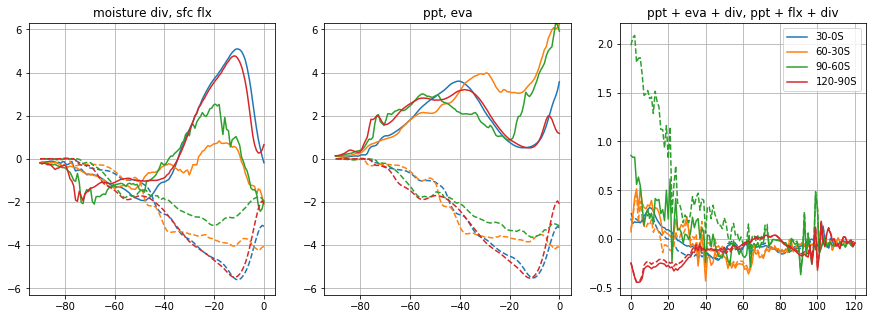

In [292]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
plts = []
for lon in [(-30, 0), (-60, -30), (-90, -60), (-120, -90)]:
    a = moist.sel(lon=slice(*lon)).mean(['lon', 'time']).squeeze() * 3600 * 24
    b = ppteva.sel(lon=slice(*lon)).mean(['lon', 'time']).squeeze() * 1000
    
    pl = axs[0].plot(a.lat, a['div'], label='{}-{}S'.format(*np.abs(lon)))[0]
    axs[0].plot(a.lat, a['flx'], ls='--', label='_', color=pl.get_color())
    axs[0].grid(True)
    axs[0].set_ylim(-6.3, 6.3)
    axs[0].set_title('moisture div, sfc flx')
    
    pl = axs[1].plot(b.lat, b['ppt'], label='{}-{}S'.format(*np.abs(lon)))[0]
    axs[1].plot(b.lat, b['eva'], ls='--', label='_', color=pl.get_color())
    axs[1].set_ylim(-6.3, 6.3)
    axs[1].grid(True)
    axs[1].set_title('ppt, eva')
    
    axs[2].plot()
    plt, plt.plot(b['ppt']+a['div']+b['eva'], label='{}-{}S'.format(*np.abs(lon)))[0]
    plt.plot(b['ppt']+a['div']+a['flx'], ls='--', label='_', color=pl.get_color())
    axs[2].grid(True)
    axs[2].set_title('ppt + eva + div, ppt + flx + div')
    
axs[2].legend()

**NOTE:** These plots are probably off since some data actually didn't download for the full time and I didn't realized until later, so the averages are over incongruent periods.

|  |  |
|--|--|
|divergence of moisture flux | kg m$^{\text{-2}}$ s$^{\text{-1}}$ |
|instantaneous moisture flux (evaporation) | kg m$^{\text{-2}}$ s ($\leftarrow$ probably an error in documentation) |
|total column water (/ vapor) | kg m$^{\text{-2}}$ |
|water-vapour / mass flux | kg m$^{\text{-1}}$ s$^{\text{-1}}$ |
|evaporation | m |
|total precipitation | m |

In [2]:
ppteva = xr.open_dataset(os.path.join(era, 'ERA-EvaPpt-dailysum.nc'))
ppteva = ppteva[['var228', 'var182']].sel(time=slice(None,'2016')).rename({'var182': 'eva', 'var228': 'ppt'})

In [4]:
moist = xr.open_dataset(os.path.join(era, 'ERA-moist.nc')).sel(time=slice(None,'2016'))
moist = moist.rename({'var84': 'div', 'var232': 'flx'})

In [68]:
def area_int(x, ave=False):
    a = 6367470 # radius of ERA earth in m
    dy = a * np.pi / 180 * 0.75
    dx = np.cos(x.lat * np.pi / 180) * a * np.pi / 180 * 0.75
    I = (x.squeeze() * dx * dy).sum(['lon', 'lat'])
    if ave:
        return I / (dx * dy).sum() / len(x.lon)
    return I

In [7]:
mst = xr.concat(
    [moist.sel(lat=slice(lat, None)).groupby_bins('lon', [-120, -90, -60, -30, 0]).apply(area_int, ave=True)
     for lat in [-70, -55]], pd.Index(['-70', '-55'], name='lat')).stack(group=('lon_bins', 'lat'))

In [8]:
ep = xr.concat(
    [ppteva.sel(lat=slice(lat, None)).groupby_bins('lon', [-120, -90, -60, -30, 0]).apply(area_int, ave=True)
     for lat in [-70, -55]], pd.Index(['-70', '-55'], name='lat')).stack(group=('lon_bins', 'lat'))

In [68]:
def trend(x, predict=False):
    if x.count()==0:
        return np.nan
    t = sm.tools.add_constant(x.time.values.astype('datetime64[s]').astype(float))
    r = sm.OLS(x.values, t, missing='drop').fit()
    v = r.params[1] * 3600 * 24 * 365.24 # slope is w.r.t. seconds
    if predict:
        return v, r.predict(t[[0, -1]])
    return v

In [125]:
def trend(x):
    t = sm.tools.add_constant(x.time.values.astype('datetime64[s]').astype(float))
    lsq = np.linalg.lstsq(t, x)[0]
    return xr.DataArray(lsq[1, :], coords=[x.coords['group']]) * 3600 * 24 * 365.24 # slope is w.r.t. seconds

In [233]:
table = xr.merge((ep.apply(trend) * 365.24 * 1000, # units are in meter
          mst.apply(trend) * 3600 * 24 * 365.24 # units are in seconds
         )).to_dataframe()
table.T.style

In [296]:
with catch_warnings():
    simplefilter('ignore')
    table = xr.merge((ep.resample(time='AS').mean().apply(trend) * 365.24 * 1000, # units are in meter
              mst.resample(time='AS').mean().apply(trend) * 3600 * 24 * 365.24 # units are in seconds
             )).to_dataframe()
    table.columns = table.columns.to_series().replace(vars)
table.T.style

In [25]:
table = pd.concat((
    trend(ep['ppt'] + ep['eva']).to_dataframe('P-E') * 365.24 * 1000,
    trend(ep['ppt']*1000 + mst['flx']*24*3600).to_dataframe('P + flx') * 365.24), 1)
table.T.style

In [295]:
with catch_warnings():
    simplefilter('ignore')
    table = pd.DataFrame([
        [trend(m) for m in md],
        [trend(m) for m in mf],
        [trend(m) for m in pp],
        [trend(m) for m in ev],
        [trend(m.resample(time='AS').mean()) for m in md],
        [trend(m.resample(time='AS').mean()) for m in mf],
        [trend(m.resample(time='AS').mean()) for m in pp],
        [trend(m.resample(time='AS').mean()) for m in ev]
    ], index=['div', 'div annual', 'evap', 'evap ann'])

table.index = pd.MultiIndex.from_product([['raw', 'ann'], ['div', 'flx', 'ppt', 'eva']], names=['aggr', 'var'])
table.columns = pd.MultiIndex.from_product([['70-90', '55-90'], ['30-0', '60-30', '90-60', '120-90']], 
                                           names=['lat S', 'lon W'])
table * 3600 * 24 * 365.24

lat S          70-90                                   55-90            \
lon W           30-0     60-30     90-60    120-90      30-0     60-30   
div        -1.055471 -1.083225 -0.411357  0.467583 -1.081283 -0.727366   
div annual -1.052121 -1.063216 -0.386411  0.480184 -1.082940 -0.770956   
evap        0.043017  0.012563 -0.244448 -0.269168  0.142316  0.214212   
evap ann    0.040132  0.002263 -0.246005 -0.272022  0.092766  0.198437   

lat S                           
lon W          90-60    120-90  
div        -1.050198 -0.800126  
div annual -1.088184 -0.833576  
evap        0.077136  0.252817  
evap ann    0.081707  0.260677

In [192]:
md = []
for lon in [(-30, 0), (-60, -30), (-90, -60), (-120, -90)]:
    md.append(area_int(moist['var84'].sel(lat=slice(-70, None), lon=slice(*lon)), ave=True))

In [103]:
cores = pd.DataFrame(columns=['lat', 'lon'])
cores.loc['SCH-1'] = [-(79 + 31/60 + 31.8/3600), -(84 + 8/60 + 56.3/3600)]
cores.loc['Ferrigno'] = [-(74 + 34/60 + 37/3600), -(86 + 54/60 + 16/3600)]
cores.loc['Bryan'] = [-(74 + 29/60 + 46/3600), -(81 +40/60 + 41/3600)]
cores

,lat,lon
SCH-1,-79.525500,-84.148972
Ferrigno,-74.576944,-86.904444
Bryan,-74.496111,-81.678056


In [166]:
i, j = geo.nearest(*np.meshgrid(ppteva.lon, ppteva.lat), *cores.loc['SCH-1'].values[::-1])[:2]
ev, pp = ppteva['eva'][:, i, j], ppteva['ppt'][:, i, j]

In [48]:
QM = xr.open_dataset(os.path.join(era, 'ERA-mdiv-mtend-qflx-totq.nc'), drop_variables=['var81', 'var92'])
QM = QM.rename({'var71': 'qu', 'var72': 'qv', 'var137': 'qtot'}).sel(time=slice(None,'2016'))
qu, qv, qt = QM['qu'].squeeze(), QM['qv'].squeeze(), QM['qtot']

In [87]:
div = xr.open_dataarray(os.path.join(era, 'ERA-moistdiv-SH.nc')).sel(time=slice(None,'2016'))
# div = div.rename({'var84': 'div'})

In [11]:
i, j = geo.nearest(*np.meshgrid(div.lon, div.lat), *cores.loc['SCH-1'].values[::-1])[:2]
# md = div.squeeze()[:, i-10:i+11, j-10:j+11]

In [37]:
um, vm = qu.mean('time'), qv.mean('time')

In [114]:
def dxy(u, v):
    a = 6367470 # radius of ERA earth in m
    dy = a * np.pi / 180 * 0.75
    dx = np.cos(u.lat * np.pi / 180) * a * np.pi / 180 * 0.75
    u, v = u.squeeze(), v.squeeze()
    dudx = (u[:, :, -1] - u[:, :, 0]) * dy
    dvdy = v[:, 0, :] * dx[0] - v[:, -1, :] * dx[-1] # for whatever crazy reason the y axis is reversed
    return (dudx.sum('lat') + dvdy.sum('lon')) / np.sum(np.repeat(dy, u.shape[-1]) * dx.values.reshape((-1, 1)))

In [74]:
i, j = geo.nearest(*np.meshgrid(QM.lon, QM.lat), *cores.loc['SCH-1'].values[::-1])[:2]

In [115]:
dq = dxy(qu[:, i-10:i+11, j-10:j+11], qv[:, i-10:i+11, j-10:j+11])

In [113]:
md_int = area_int(md, ave=True)

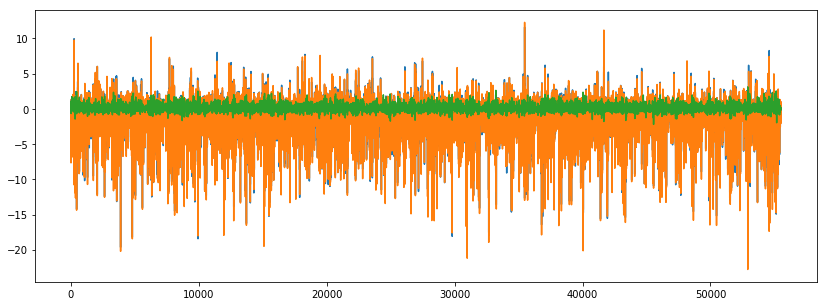

In [121]:
plt.figure(figsize=(14, 5))
plt.plot(dq * 3600 * 24)
plt.plot(md_int * 3600 * 24)
plt.plot((dq-md_int) * 3600 * 24)

In [32]:
def cube(x):
    lat = iris.coords.DimCoord(x.lat, standard_name='latitude', units='degrees')
    lon = iris.coords.DimCoord(x.lon, standard_name='longitude', units='degrees')
    return iris.cube.Cube(x, dim_coords_and_dims=[(lat, 0), (lon, 1)])

colors = {'SCH-1': 'deeppink', 'Ferrigno': 'lightseagreen', 'Bryan': 'olive'}
def core_plot():
    pos = {'SCH-1': (10, -30), 'Ferrigno': (10, -30), 'Bryan': (5, 20)}
    for name, (lon, lat) in cores[['lon', 'lat']].iterrows():
        plt.plot(lon, lat, 'o', color=colors[name], transform=crs.PlateCarree())
        plt.gca().annotate(name, xy=(lon, lat), xycoords=crs.PlateCarree()._as_mpl_transform(plt.gca()),
                          color=colors[name], xytext=pos[name], textcoords='offset points',
                           arrowprops={'arrowstyle': '->', 'color':colors[name]})

def extent(ax):
    dx2 = 1.9e6
    x0 = -2.4e6
    y0 = -5e5
    ax.set_xlim(x0, x0+dx2)
    ax.set_ylim(y0, y0+dx2)

In [6]:
b1 = geo.box(-87, -81, -78, -80) # x, x, y, y
b2 = geo.box(-87, -81, -73, -76)

In [10]:
b1 = geo.box(-87, -81, -70, -90)
b2 = geo.box(-90, -78, -70, -90)

In [476]:
dm = xr.open_dataarray(os.path.join(era, 'ERA-moistdiv-mean.nc')).squeeze()
qm = xr.open_dataset(os.path.join(era, 'ERA-qflx-mean.nc')).squeeze()
qu, qv = qm['var71'], qm['var72']

In [477]:
du = qu.sel(lon=slice(-90, -78), lat=slice(-70, None))
dv = qv.sel(lon=slice(-90, -78), lat=slice(-70, None))
div = dm.sel(lon=slice(-90, -78), lat=slice(-70, None))

nx1 = du.shape[1]
du1 = du[:, -1] - du[:, 0]
du2 = du.sel(lon=slice(-87, -81))
nx2 = du2.shape[1]
du2 = du2[:, -1] - du2[:, 0]

dv1 = dv.diff('lat', 1)
dv1['lat'] = dv1.lat + .75/2

In [478]:
a = 6367470 # radius of ERA earth in m
dy = a * np.pi / 180 * 0.75
dx = np.cos(du.lat * np.pi / 180) * a * np.pi / 180 * 0.75

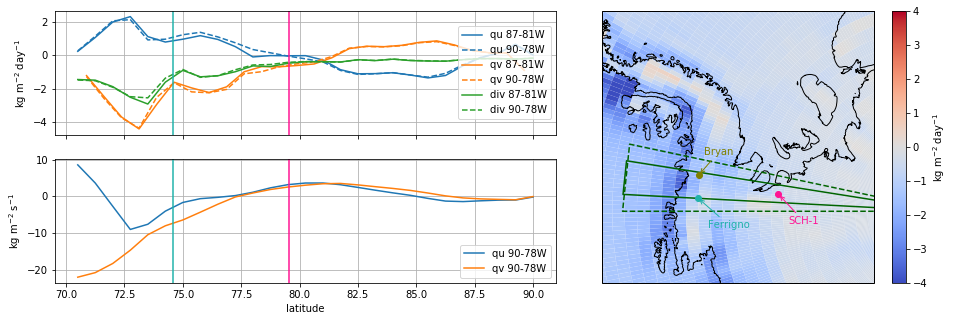

In [481]:
fig = plt.figure(figsize=(16, 5))
axs = gs.GridSpec(2, 7)

day = 3600 * 24

pos = axs[0, :4].get_position(fig)
ax = fig.add_axes(pos.bounds)

pl = ax.plot(-du.lat, day * du2 / dx / (nx2 - 1), label='qu 87-81W')[0]
ax.plot(-du.lat, day * du1 / dx / (nx1 - 1), ls='--', color=pl.get_color(), label='qu 90-78W')

pl = ax.plot(-dv1.lat, -day * dv1.sel(lon=slice(-87, -81)).mean(['lon']) / dy, label='qv 87-81W')[0]
ax.plot(-dv1.lat, -day * dv1.mean(['lon']) / dy, ls='--', color=pl.get_color(), label='qv 90-78W')

pl = ax.plot(-div.lat, day * div.sel(lon=slice(-87, -81)).mean(['lon']), label='div 87-81W')[0]
ax.plot(-div.lat, day * div.mean(['lon']), ls='--', color=pl.get_color(), label='div 90-78W')

ax.axvline(-cores.loc['SCH-1', 'lat'], color=colors['SCH-1'])
ax.axvline(-cores.loc['Ferrigno', 'lat'], color=colors['Ferrigno'])
ax.set_xticklabels([])
ax.set_ylabel('kg m$^{-2}$ day$^{-1}$')
ax.grid()
plt.legend(loc='right');


pos = axs[1, :4].get_position(fig)
ax = fig.add_axes(pos.bounds)
ax.plot(-du.lat, du.mean('lon'), label='qu 90-78W')
ax.plot(-dv.lat, dv.mean('lon'), label='qv 90-78W')
ax.axvline(-cores.loc['SCH-1', 'lat'], color=colors['SCH-1'])
ax.axvline(-cores.loc['Ferrigno', 'lat'], color=colors['Ferrigno'])
ax.set_ylabel('kg m$^{-2}$ s$^{-1}$')
ax.grid()
ax.set_xlabel('latitude')
plt.legend();


pos = axs[:, 4:].get_position(fig)
ax = fig.add_axes(pos.bounds, projection=crs.SouthPolarStereo())
plt.set_cmap('coolwarm')

with catch_warnings():
    simplefilter('ignore')
    pl = iplt.pcolor(day * cube(dm), vmin=-4, vmax=4)
ax.plot(*b1.rect, transform=crs.PlateCarree(), color='darkgreen')
ax.plot(*b2.rect, transform=crs.PlateCarree(), ls='--', color='darkgreen')

core_plot()
cb = plt.colorbar(pl)
plt.gca().add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='k')
extent(plt.gca())
cb.set_label('kg m$^{-2}$ day$^{-1}$');

**Top left:** Divergences of zonal (*qu*) and meridional (*qv*) moisture fluxes and the two-dimensional (*div*) divergence, against latitude. Hatched lines refer to the bigger 'sector' indicated on the map on the right. Zonal divergences are computed as differences at the zonal boundaries of the sector, whereas meridional ones are index-wise (i.e. from one grid point to the next). The divergences have units of kg m$^{\text{-2}}$ **day**$^{\text{-1}}$.   
**Bottom left:** Absolute values of the fluxes (kg m$^{\text{-2}}$ **s**$^{\text{-1}}$).   
The red and lime lines correspond to the latitudes of the cores indicated by the same color on the map.   
Remember that **negative divergence is convergence**!   
**Right:** The shading indicates the two-dimensional moisture flux divergence (kg m$^{\text{-2}}$ **day**$^{\text{-1}}$). The dots mark the location of three ice cores (red: SCH-1, lime: Ferrigno, dark green: Bryan Coast).

In [11]:
div = xr.open_dataarray(os.path.join(era, 'ERA-moistdiv-90-78-70-90.nc')).squeeze()
qf = xr.open_dataset(os.path.join(era, 'ERA-qflx-90-78-70-90.nc')).squeeze()
qu, qv = qf['var71'], qf['var72']

In [13]:
a = 6367470
dy = a * np.pi / 180 * 0.75
dx = np.cos(qu.lat * np.pi / 180) * a * np.pi / 180 * 0.75
nx = qu.shape[1]

du = (qu[:, :, -1] - qu[:, :, 0]) / dx / (nx - 1)
dv = qv.diff('lat', 1).mean('lon') / dy
dv['lat'] = dv.lat + .75/2

In [21]:
divyear = xr.open_dataset(os.path.join(era, 'ERA-moistdiv-yearly.nc')).sel(lat=slice(-50, None))['var84'].squeeze()
trend_div = trend(divyear.stack(group=('lon', 'lat'))).unstack('group').transpose('lat', 'lon')

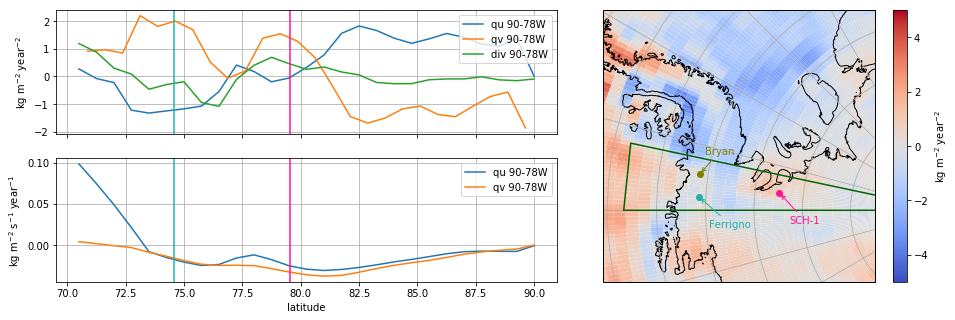

In [26]:
year = 3600 * 24 * 365.24

fig = plt.figure(figsize=(16, 5))
axs = gs.GridSpec(2, 7)

pos = axs[0, :4].get_position(fig)
ax = fig.add_axes(pos.bounds)

ax.plot(-du.lat, year * trend(du), label='qu 90-78W')
ax.plot(-dv.lat, -year * trend(dv), label='qv 90-78W')
ax.plot(-div.lat, year * trend(div.mean('lon')), label='div 90-78W')
ax.axvline(-cores.loc['SCH-1', 'lat'], color=colors['SCH-1'])
ax.axvline(-cores.loc['Ferrigno', 'lat'], color=colors['Ferrigno'])
ax.set_ylabel('kg m$^{-2}$ year$^{-2}$')
ax.set_xticklabels([])
ax.grid()
ax.legend()

pos = axs[1, :4].get_position(fig)
ax = fig.add_axes(pos.bounds)

ax.plot(-qu.lat, trend(qu.mean('lon')), label='qu 90-78W')
ax.plot(-qv.lat, trend(qv.mean('lon')), label='qv 90-78W')
ax.axvline(-cores.loc['SCH-1', 'lat'], color=colors['SCH-1'])
ax.axvline(-cores.loc['Ferrigno', 'lat'], color=colors['Ferrigno'])
ax.set_ylabel('kg m$^{-2}$ s$^{-1}$ year$^{-1}$')
ax.grid()
ax.set_xlabel('latitude')
ax.legend();

pos = axs[:, 4:].get_position(fig)
ax = fig.add_axes(pos.bounds, projection=crs.SouthPolarStereo())
plt.set_cmap('coolwarm')

with catch_warnings():
    simplefilter('ignore')
    pl = iplt.pcolor(year * cube(trend_div), vmin=-5, vmax=5)

ax.plot(*b2.rect, transform=crs.PlateCarree(), color='darkgreen')
ax.gridlines()
core_plot()

cb = plt.colorbar(pl)
plt.gca().add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='k')
extent(plt.gca())
cb.set_label('kg m$^{-2}$ year$^{-2}$');

As above, but with trends (linear, least square fitted).   
**Top left:** Trends in the divergences (zonal, meridional, two-dimensional). See above for details on computation. Units are kg m$^{-2}$ **year**$^{-2}$.   
**Bottom left:** Trends in the absolute values of zonal and meridional moisture fluxes (kg m$^{\text{-2}}$ **s**$^{-1}$ year$^{-1}$).   
**Right:** Map of the trend (kg m$^{-2}$ **year**$^{-2}$) in the two-dimensional moisture flux divergence. The rest as above.

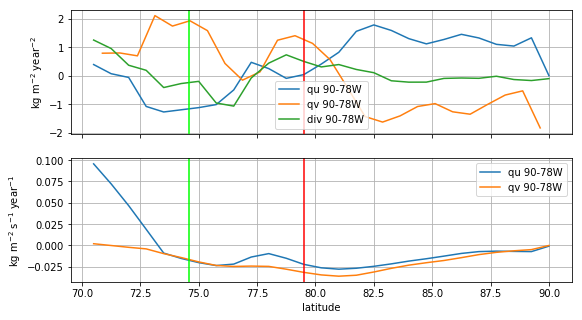

In [473]:
year = 3600 * 24 * 365.24
def yrs(x): 
    with catch_warnings():
        simplefilter('ignore')
        return x.resample(time='AS').mean('time')

fig = plt.figure(figsize=(16, 5))
axs = gs.GridSpec(2, 7)

pos = axs[0, :4].get_position(fig)
ax = fig.add_axes(pos.bounds)

ax.plot(-du.lat, year * trend(yrs(du)), label='qu 90-78W')
ax.plot(-dv.lat, -year * trend(yrs(dv)), label='qv 90-78W')
ax.plot(-div.lat, year * trend(yrs(div).mean('lon')), label='div 90-78W')
ax.axvline(-cores.loc['SCH-1', 'lat'], color='r')
ax.axvline(-cores.loc['Ferrigno', 'lat'], color='lime')
ax.set_ylabel('kg m$^{-2}$ year$^{-2}$')
ax.set_xticklabels([])
ax.grid()
ax.legend()

pos = axs[1, :4].get_position(fig)
ax = fig.add_axes(pos.bounds)

ax.plot(-qu.lat, trend(yrs(qu).mean('lon')), label='qu 90-78W')
ax.plot(-qv.lat, trend(yrs(qv).mean('lon')), label='qv 90-78W')
ax.axvline(-cores.loc['SCH-1', 'lat'], color='r')
ax.axvline(-cores.loc['Ferrigno', 'lat'], color='lime')
ax.set_ylabel('kg m$^{-2}$ s$^{-1}$ year$^{-1}$')
ax.grid()
ax.set_xlabel('latitude')
ax.legend();

Just a test: as above but with yearly resampling first (for the curves, the map above is from yearly means anyway).

In [22]:
qfyear = xr.open_dataset(os.path.join(era, 'ERA-qflx-yearly.nc')).sel(lat=slice(-50, None)).squeeze()
qv, qu = qfyear['var71'], qfyear['var72']

In [45]:
a = 6367470
dy = a * np.pi / 180 * 0.75
dx = np.cos(qu.lat * np.pi / 180) * a * np.pi / 180 * 0.75

In [46]:
du = qu.diff('lon', 1) / dx
du['lon'] = du.lon - .75/2
dv = - qv.diff('lat', 1) / dy
dv['lat'] = dv.lat + .75/2 # reversed axis

In [47]:
tdu = trend(du.stack(group=('lon', 'lat'))).unstack('group').transpose('lat', 'lon')
tdv = trend(dv.stack(group=('lon', 'lat'))).unstack('group').transpose('lat', 'lon')

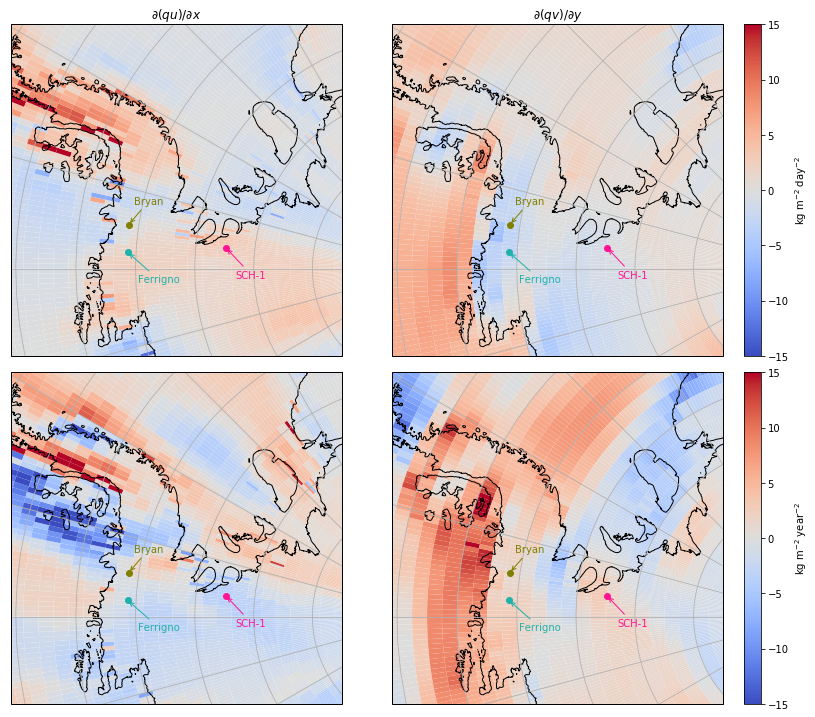

In [64]:
fig, axs = plt.subplots(2, 2, figsize=(15, 12.5), subplot_kw={'projection': crs.SouthPolarStereo()})
fig.subplots_adjust(wspace=0.02, hspace=0.05)

day = 3600 * 24
year = day * 365.24

plt.sca(axs[0, 0])
with catch_warnings():
    simplefilter('ignore')
    iplt.pcolor(day * cube(du.mean('time')), vmin=-15, vmax=15)

plt.gca().add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='k')

core_plot()
extent(plt.gca())
plt.gca().gridlines()
plt.title('$\partial (qu)/\partial x$')

plt.sca(axs[0, 1])
with catch_warnings():
    simplefilter('ignore')
    pl = iplt.pcolor(day * cube(dv.mean('time')), vmin=-15, vmax=15)

plt.gca().add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='k')
cb = plt.colorbar(pl, ax=plt.gca())

core_plot()
extent(plt.gca())
plt.gca().gridlines()

plt.title('$\partial (qv)/\partial y$')
cb.set_label('kg m$^{-2}$ day$^{-2}$')



plt.sca(axs[1, 0])
with catch_warnings():
    simplefilter('ignore')
    iplt.pcolor(year * cube(tdu), vmin=-15, vmax=15)

plt.gca().add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='k')

core_plot()
extent(plt.gca())
plt.gca().gridlines()

plt.sca(axs[1, 1])
with catch_warnings():
    simplefilter('ignore')
    pl = iplt.pcolor(year * cube(tdv), vmin=-15, vmax=15)

plt.gca().add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='k')
cb = plt.colorbar(pl, ax=plt.gca())

core_plot()
extent(plt.gca())
plt.gca().gridlines()

cb.set_label('kg m$^{-2}$ year$^{-2}$')

**Top:** Zonal (**left**) and meridional (**right**) moisture flux convergences, computed as grid-index-wise differences.    
**Bottom:** Corresponding **trends**.

### Comments

The change in zonal divergence seems to be consistent with a westward shift od the Amundsen Sea Low, whereas that in the meridional divergence with an increased pressure gradient.

In [162]:
p = (uvq.hyam + uvq.hybm*1013.25)

In [8]:
uvgpy = xr.open_dataset(os.path.join(era, 'ERA-gph-u-v-yearly.nc')).sel(lat=slice(-50, None)).squeeze()
u, v, gp = uvgpy['var131'], uvgpy['var132'], uvgpy['var129']

In [9]:
uv10y = xr.open_dataset(os.path.join(era, 'ERA-UV10-yearly.nc')).sel(lat=slice(-50, None)).squeeze()
u10, v10 = uv10y['var165'], uv10y['var166']

In [249]:
uv10 = xr.open_dataset(os.path.join(era, 'ERA-UV10-SH.nc')).sel(lat=slice(-50, None)).squeeze()
uvm = uv10.mean('time')

KeyboardInterrupt: 

In [128]:
u10m, v10m = uvm['var165'], uvm['var166']

/sata1_ceazalabs/arno/HPC/n004Home/miniconda3/envs/ant/lib/python3.6/site-packages/cartopy/mpl/geoaxes.py:1711: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  u, v = self.projection.transform_vectors(t, x, y, u, v)


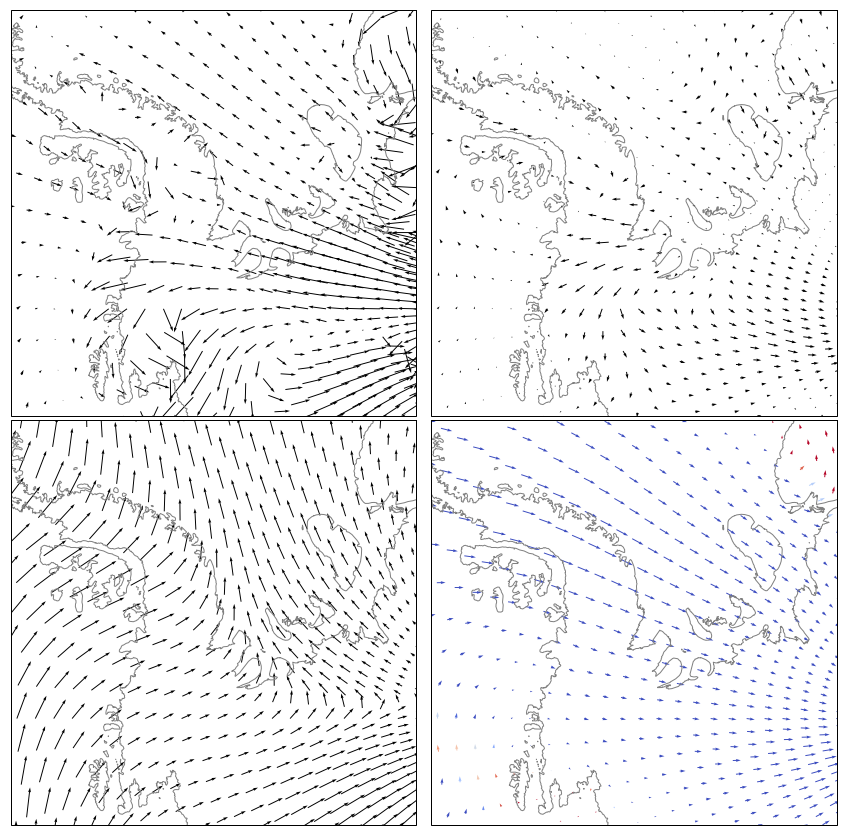

In [258]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15), subplot_kw={'projection': crs.SouthPolarStereo()})
fig.subplots_adjust(wspace=0.01, hspace=0.01)

axs[0, 0].quiver(u10.lon[::5], u10.lat, 
          u10[:, :, ::5].mean('time').values, v10[:, :, ::5].mean('time').values, scale=100,
          transform=crs.PlateCarree())
axs[0, 0].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')
extent(axs[0, 0])

v10t = trend(v10[:, :, ::5].stack(group=('lat', 'lon'))).unstack('group').values
pl = axs[0, 1].quiver(u10.lon[::5], u10.lat, 
              trend(u10[:, :, ::5].stack(group=('lat', 'lon'))).unstack('group').values,
              v10t, 
              transform=crs.PlateCarree(), scale=1)
axs[0, 1].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')
extent(axs[0, 1])

axs[1, 0].quiver(u.lon[::5], u.lat, 
          u.mean('time').values[:, ::5], v.mean('time').values[:, ::5], scale=100,
          transform=crs.PlateCarree())
axs[1, 0].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')
extent(axs[1, 0])

plt.set_cmap('coolwarm')
vt = trend(v[:, :, ::5].stack(group=('lat', 'lon'))).unstack('group').values
pl = axs[1, 1].quiver(u.lon[::5], u.lat, 
              trend(u[:, :, ::5].stack(group=('lat', 'lon'))).unstack('group').values,
              vt, vt, clim=(-.001, .001),
              transform=crs.PlateCarree(), scale=1)
axs[1, 1].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')

extent(axs[1, 1])

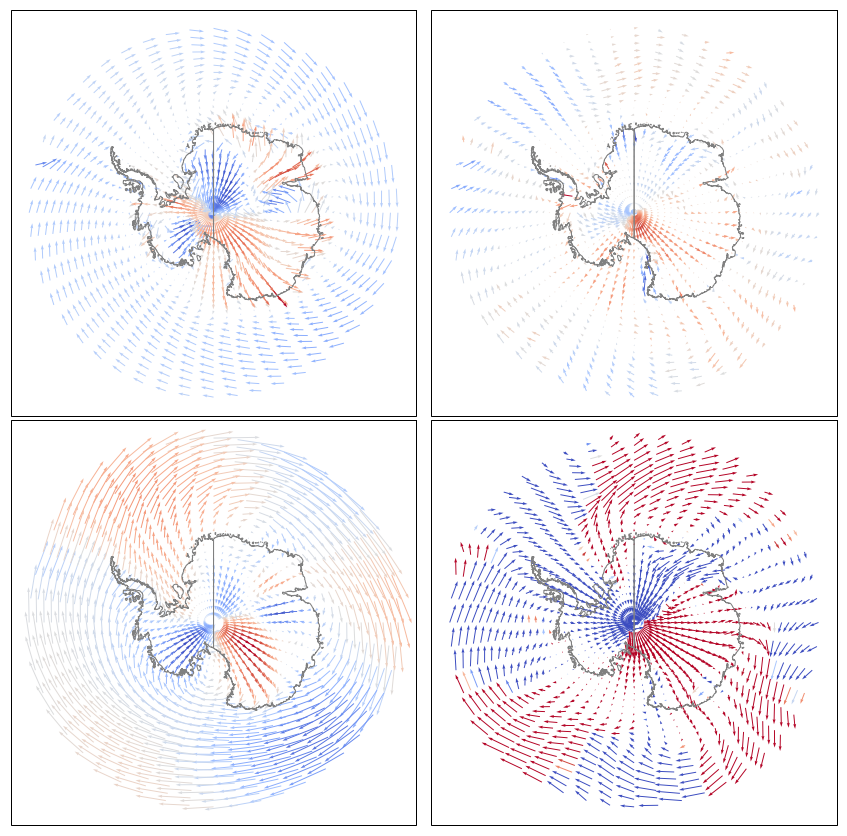

In [17]:
thin = [2, 10]

plt.set_cmap('coolwarm')
fig, axs = plt.subplots(2, 2, figsize=(15, 15), subplot_kw={'projection': crs.SouthPolarStereo()})
fig.subplots_adjust(wspace=0.01, hspace=0.01)

U = u10[:, ::thin[0], ::thin[1]].mean('time').values
V = v10[:, ::thin[0], ::thin[1]].mean('time').values
axs[0, 0].quiver(u10.lon[::thin[1]], u10.lat[::thin[0]], U, V, V, scale=200,
          transform=crs.PlateCarree())
axs[0, 0].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')

U = trend(u10[:, ::thin[0], ::thin[1]].stack(group=('lat', 'lon'))).unstack('group').values
V = trend(v10[:, ::thin[0], ::thin[1]].stack(group=('lat', 'lon'))).unstack('group').values
pl = axs[0, 1].quiver(u10.lon[::thin[1]], u10.lat[::thin[0]], U, V, V, scale=1,
              transform=crs.PlateCarree())
axs[0, 1].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')

U = u[:, ::thin[0], ::thin[1]].mean('time').values
V = v[:, ::thin[0], ::thin[1]].mean('time').values
axs[1, 0].quiver(u.lon[::thin[1]], u.lat[::thin[0]], U, V, V, scale=200,
          transform=crs.PlateCarree())
axs[1, 0].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')

U = trend(u[:, ::thin[0], ::thin[1]].stack(group=('lat', 'lon'))).unstack('group').values
V = trend(v[:, ::thin[0], ::thin[1]].stack(group=('lat', 'lon'))).unstack('group').values
pl = axs[1, 1].quiver(u.lon[::thin[1]], u.lat[::thin[0]], U, V, V, scale=1,
                      clim=(-.001, .001), transform=crs.PlateCarree(), )
axs[1, 1].add_geometries(antarctica.geometries(), crs.PlateCarree(), facecolor='none', edgecolor='grey')

In [7]:
uvq = xr.open_dataset(os.path.join(era, 'ERA-u-v-q.nc')).sel(lat=slice(-50, None)).squeeze()
u, v, q = uvq['var131'], uvq['var132'], uvq['var133']
# um, vm = u.mean('time'), v.mean('time')

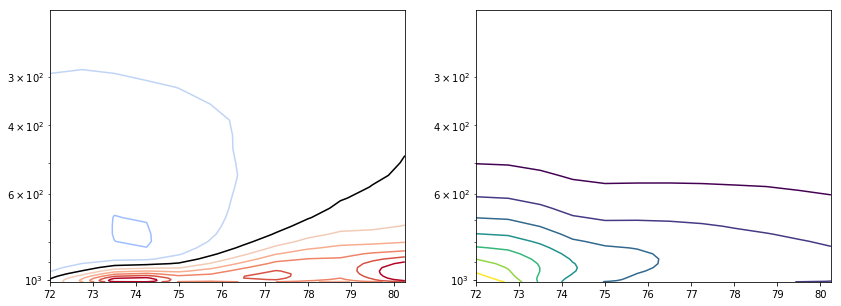

In [245]:
fig, axs = plt.subplots(1, 2, figsize=(14, 5))
axs[0].contour(-vm.lat, pm/100, vm.mean('lon'), np.linspace(-5,5,11), vmin=-5, vmax=5)
axs[0].contour(-vm.lat, pm/100, vm.mean('lon'),[0], colors='k')
axs[0].set_yscale('log')
axs[0].invert_yaxis()

plt.set_cmap('viridis')
axs[1].contour(-vm.lat, pm/100, qm.mean('lon'))
axs[1].set_yscale('log')
axs[1].invert_yaxis()

In [37]:
with catch_warnings():
    simplefilter('ignore')
    uvq = iris.load(os.path.join(era, 'ERA-u-v-q.nc'))

In [38]:
import iris.coord_categorisation as ccad

In [95]:
with catch_warnings():
    simplefilter('ignore')
    slp = iris.load(os.path.join(era, 'ERA-SLP-SH.nc'), 
        iris.Constraint(longitude=lambda lon: (lon >= -90) & (lon <= -78)) & 
        iris.Constraint(latitude=lambda lat: (lat >= -90) & (lat <= -70))
    )[0]

In [53]:
# area-weighted divergence averages over a box

def area_flxs(u, v):
    a = 6367470
    dy = a * np.pi / 180 * 0.75
    dx = np.cos(u.lat * np.pi / 180) * a * np.pi / 180 * 0.75
    du = u.isel(lon=[0, -1]).diff('lon') * dy
    dv = (v * dx).isel(lat=[-1, 0]).diff('lat')
    
    area = dx * xr.DataArray(np.repeat(dy, len(u.lon)), coords=[('lon', dv.lon)])
    sum_a = np.sum(area)
    du = du.sum('lat').squeeze() / sum_a
    dv = dv.sum('lon').squeeze() / sum_a
    return du, dv
    
def area_w_mean(x):
    a = 6367470
    dy = a * np.pi / 180 * 0.75
    dx = np.cos(x.lat * np.pi / 180) * a * np.pi / 180 * 0.75
    nx = len(x.lon)
    area = dx * xr.DataArray(np.repeat(dy, nx), coords=[('lon', x.lon)])
    return (x * area).sum(['lon', 'lat']).squeeze() / np.sum(area)

<IPython.core.display.Javascript object>


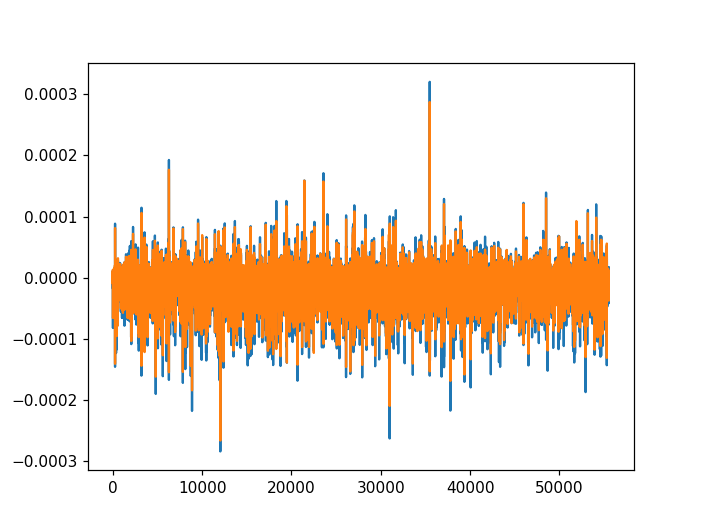

In [422]:
plt.figure()
plt.plot(dd)
plt.plot(du+dv)

In [446]:
def wind_plot(axs, wind, moist_div, qu_div, qv_div, rlabels=[70, -120, -170]):
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    width = 2 * np.pi / len(wind[0])
    day = 3600 * 24

    axs[0].bar(wind[1][:-1], day * wind[0], width=width, align='edge', color=colors[3])
    axs[0].set_xticklabels(['E', 'NE', 'N', 'NW', 'W', 'SW', 'S', 'SE'])
    axs[0].set_rlabel_position(rlabels[0])

    axs[1].bar(moist_div.bin_edges[:-1], -day * moist_div.statistic, width=width, align='edge', color=colors[2])
    axs[1].set_xticklabels(['E', 'NE', 'N', 'NW', 'W', 'SW', 'S', 'SE'])
    axs[1].set_rlabel_position(rlabels[1])

    axs[2].bar(moist_div.bin_edges[:-1], -day * moist_div.statistic, width=width, align='edge', color=colors[2])

    for b in axs[2].bar(qu_div.bin_edges[:-1], -day * qu_div.statistic, width=width, align='edge', color='none'):
        b.set_edgecolor(colors[0])
        b.set_linewidth(3)

    for b in axs[2].bar(qv_div.bin_edges[:-1], -day * qv_div.statistic, width=width, align='edge', color='none'):
        b.set_edgecolor(colors[1])
        b.set_linewidth(3)

    axs[2].set_xticklabels(['E', 'NE', 'N', 'NW', 'W', 'SW', 'S', 'SE'])
    axs[2].set_rlabel_position(rlabels[2])

In [436]:
box = {'lon': slice(-87, -81), 'lat': slice(-76, -81)}
box2 = {'lon': slice(360-87, 360-81), 'lat': slice(-76, -81)}

In [12]:
qflx = xr.open_dataset(os.path.join(era, 'ERA-qflx-90-78-70-90.nc'))
mdiv = xr.open_dataarray(os.path.join(era, 'ERA-moistdiv-90-78-70-90.nc'))

In [421]:
du, dv = area_flxs(qflx['var71'].sel(**box), qflx['var72'].sel(**box))
dd = area_w_mean(mdiv.sel(**box))

In [424]:
wind_dir = np.arctan2(-area_w_mean(v.sel(lev=60, **box2)), -area_w_mean(u.sel(lev=60, **box2)))
h_div = binned_statistic(wind_dir, d, bins=12)
h_du = binned_statistic(wind_dir, du, bins=12)
h_dv = binned_statistic(wind_dir, dv, bins=12)
w = np.histogram(wind_dir, 12)

In [8]:
uvqp = xr.open_dataset('/sata1_ceazalabs/arno/HPC/uvHome/code/antarctica/ERA-massw-u-v-q.nc')

In [438]:
ps = uvqp['dp'].sel(lev=slice(35, None), **box2).sum('lev')
uw = area_w_mean(uvqp['var131'].sel(lev=slice(35, None), **box2).sum('lev') / ps)
vw = area_w_mean(uvqp['var132'].sel(lev=slice(35, None), **box2).sum('lev') / ps)
qw = area_w_mean(uvqp['var133'].sel(lev=slice(35, None), **box2).sum('lev') / ps)

In [439]:
wind_dir = np.arctan2(-vw, -uw)
hw_div = binned_statistic(wind_dir, d, bins=12)
hw_du = binned_statistic(wind_dir, du, bins=12)
hw_dv = binned_statistic(wind_dir, dv, bins=12)
ww = np.histogram(wind_dir, 12)

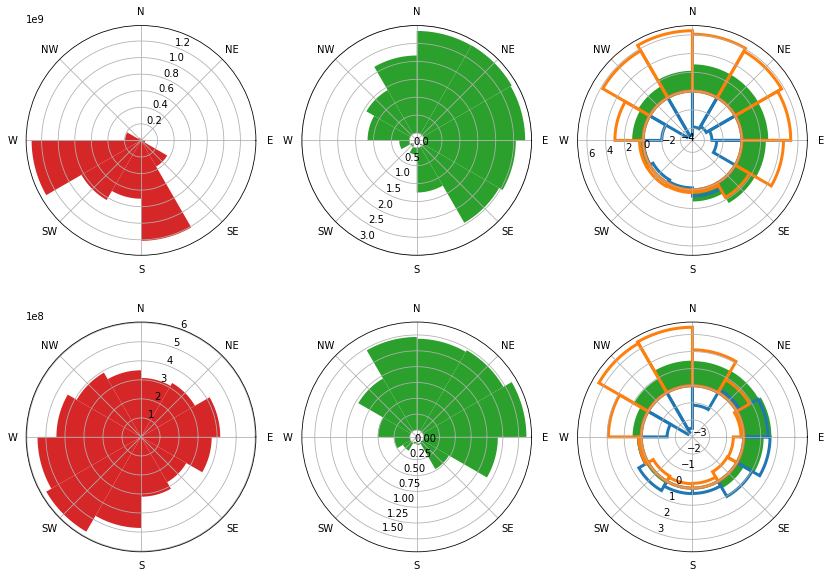

In [448]:
fig, axs = plt.subplots(2, 3, subplot_kw={'projection': 'polar'}, figsize=(14, 10))
wind_plot(axs[0, :], w, h_div, h_du, h_dv)
wind_plot(axs[1, :], ww, hw_div, hw_du, hw_dv, rlabels=[70, -110, -110])

Wind direction histograms (**red**) and binned statistics using the wind as bin variable. **Middle/green**: Total convergence; **Blue**: u-convergence; **Orange**: v-convergence. (Note, convergence is being plotted, not divergence. Negative values denote divergence).   
**Top:** Using the lowermost layer winds.
**Bottom:** Using the mass-weighted vertical mean of layers 35-60 for u, v (which should contain most of the moisture, see q plot).   
**Latitudes 76-81 S**

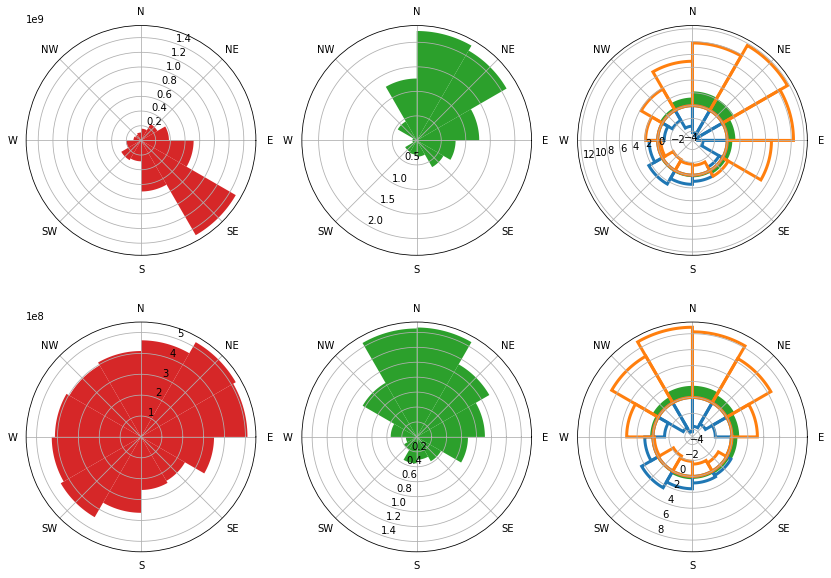

In [456]:
fig, axs = plt.subplots(2, 3, subplot_kw={'projection': 'polar'}, figsize=(14, 10))
wind_plot(axs[0, :], w, h_div, h_du, h_dv)
wind_plot(axs[1, :], ww, hw_div, hw_du, hw_dv, rlabels=[70, -110, -110])

Same as above, but for a box with **latitudes 71-76 S**.

In [451]:
box = {'lon': slice(-87, -81), 'lat': slice(-71, -76)}
box2 = {'lon': slice(360-87, 360-81), 'lat': slice(-71, -76)}

In [452]:
du, dv = area_flxs(qflx['var71'].sel(**box), qflx['var72'].sel(**box))
dd = area_w_mean(mdiv.sel(**box))

In [453]:
wind_dir = np.arctan2(-area_w_mean(v.sel(lev=60, **box2)), -area_w_mean(u.sel(lev=60, **box2)))
h_div = binned_statistic(wind_dir, d, bins=12)
h_du = binned_statistic(wind_dir, du, bins=12)
h_dv = binned_statistic(wind_dir, dv, bins=12)
w = np.histogram(wind_dir, 12)

In [454]:
ps = uvqp['dp'].sel(lev=slice(35, None), **box2).sum('lev')
uw = area_w_mean(uvqp['var131'].sel(lev=slice(35, None), **box2).sum('lev') / ps)
vw = area_w_mean(uvqp['var132'].sel(lev=slice(35, None), **box2).sum('lev') / ps)
qw = area_w_mean(uvqp['var133'].sel(lev=slice(35, None), **box2).sum('lev') / ps)

In [455]:
wind_dir = np.arctan2(-vw, -uw)
hw_div = binned_statistic(wind_dir, d, bins=12)
hw_du = binned_statistic(wind_dir, du, bins=12)
hw_dv = binned_statistic(wind_dir, dv, bins=12)
ww = np.histogram(wind_dir, 12)

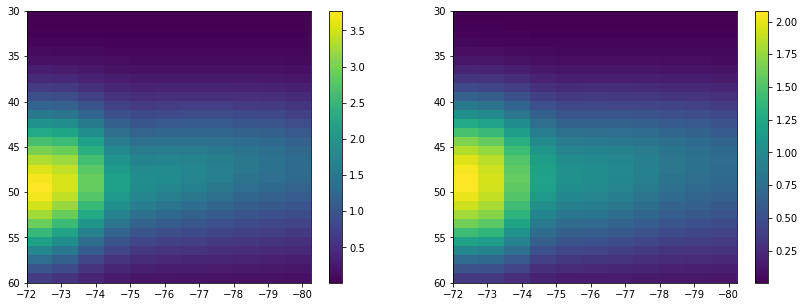

In [321]:
qm = uvqp['var133'].mean('lon')

fig, axs = plt.subplots(1, 2, figsize=(14,5))
pl = axs[0].pcolormesh(qm.lat, qm.lev, qm.mean('time'))
axs[0].invert_yaxis()
axs[0].invert_xaxis()
plt.colorbar(pl, ax=axs[0])

pl = axs[1].pcolormesh(qm.lat, qm.lev, qm.std('time'))
axs[1].invert_yaxis()
axs[1].invert_xaxis()
plt.colorbar(pl, ax=axs[1])

In [11]:
# monthly averages and anomalies with xarray

def monthly(x):
    t = x.indexes['time']
    x.coords['month'] = ('time', pd.DatetimeIndex('{}-{}'.format(*x) for x in zip(t.year, t.month)))
    return x.groupby('month')

def lat_section_flxs(u, v):
    a = 6367470
    dy = a * np.pi / 180 * 0.75
    dx = np.cos(u.lat * np.pi / 180) * a * np.pi / 180 * 0.75

    du = u.isel(lon=[0, -1]).diff('lon') / dx / (len(u.lon) - 1)
    dv = - v.diff('lat', 1).mean('lon') / dy
    dv['lat'] = dv.lat + .75/2
    return du.squeeze(), dv.squeeze()

In [18]:
du0, dv0 = lat_section_flxs(qflx['var71'], qflx['var72'])

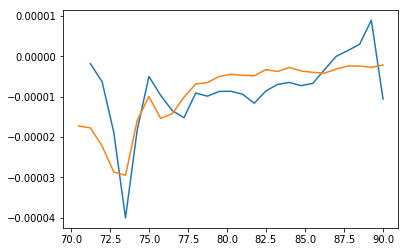

In [499]:
fig, axs = plt.subplots()
axs.plot(-dv.lat, (du.isel(lat=slice(1, None))+dv).mean('time'))
axs.plot(-mdiv.lat, mdiv.mean(['lon', 'time']).squeeze())

In [17]:
du, dv = lat_section_flxs((uvq['var131']*qp).sum('lev'), (uvq['var132']*qp).sum('lev'))

In [93]:
um, vm, qm = monthly(uvq['var131']), monthly(uvq['var132']), monthly(uvqp['var133'])
qmm, qmp = qm.mean('time'), qm.apply(lambda x:x - x.mean('time'))

dum, dvm = lat_section_flxs(um.mean('time') * qmm, vm.mean('time') * qmm)
dup, dvp = lat_section_flxs(
    um.apply(lambda x:x - x.mean('time')) * qmp, 
    vm.apply(lambda x:x - x.mean('time')) * qmp)

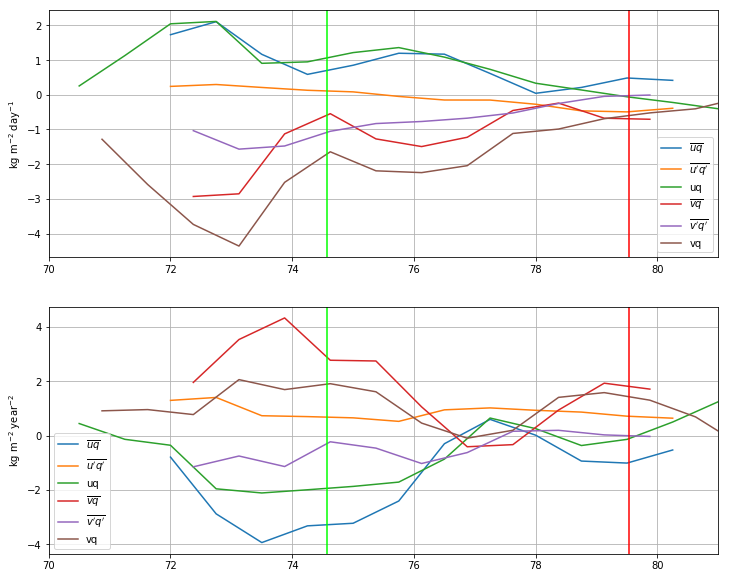

In [104]:
fig, axs = plt.subplots(2, 1, figsize=(12, 10))

day = 3600 * 24
year = day * 365.24

t = lambda x: trend(x.rename({'month': 'time'}))

ax = axs[0]
ax.plot(-du.lat, day * dum.mean('month').sum('lev') / 9.8, label='$\overline{uq}$')
ax.plot(-du.lat, day * dup.mean('time').sum('lev') / 9.8, label="$\overline{u'q'}$")
ax.plot(-du0.lat, day * du0.mean('time'), label='uq')
ax.plot(-dv.lat, day * dvm.mean('month').sum('lev') / 9.8, label='$\overline{vq}$')
ax.plot(-dv.lat, day * dvp.mean('time').sum('lev') / 9.8, label="$\overline{v'q'}$")
ax.plot(-dv0.lat, day * dv0.mean('time'), label='vq')

ax.axvline(-cores.loc['SCH-1', 'lat'], color='r')
ax.axvline(-cores.loc['Ferrigno', 'lat'], color='lime')
ax.set_xlim(70, 81)
ax.set_ylabel('kg m$^{-2}$ day$^{-1}$')
ax.legend()
ax.grid(True)

ax = axs[1]
ax.plot(-du.lat, year * t(dum.sum('lev') / 9.8), label='$\overline{uq}$')
ax.plot(-du.lat, year * t(monthly(dup.sum('lev') / 9.8).mean('time')), label="$\overline{u'q'}$")
ax.plot(-du0.lat, year * t(monthly(du0).mean('time')), label='uq')
ax.plot(-dv.lat, year * t(dvm.sum('lev') / 9.8), label='$\overline{vq}$')
ax.plot(-dv.lat, year * t(monthly(dvp.sum('lev') / 9.8).mean('time')), label="$\overline{v'q'}$")
ax.plot(-dv0.lat, year * t(monthly(dv0).mean('time')), label='vq')

ax.axvline(-cores.loc['SCH-1', 'lat'], color='r')
ax.axvline(-cores.loc['Ferrigno', 'lat'], color='lime')
ax.set_xlim(70, 81)
ax.set_ylabel('kg m$^{-2}$ year$^{-2}$')
ax.legend()
ax.grid(True)

In [194]:
def trend(x, time='time'):
    """returns trend per year"""
    year =  3600 * 24 * 365.24 # slope is w.r.t. seconds
    t = sm.tools.add_constant(x[time].values.astype('datetime64[s]').astype(float))
    lsq = np.linalg.lstsq(t, x)[0]
    coords = [c for c in set(x.coords) - {time} if x.coords[c].shape != ()]
    if len(coords) == 1:
        return xr.DataArray(lsq[1, :], coords=x.coords[coords[0]]) * year
    elif len(coords) == 0:
        return lsq[1] * year
    else:
        raise Exception('more than one additional coordinate')

In [212]:
def flux_decomp(u, v, q, box, time_grouper):
    """q should be pressure-weighted"""
    
    # "bar/prime"
    bp = lambda g: (g.mean('time'), g.apply(lambda x: x - x.mean('time')))
    
    u_bar, u_prime = bp(time_grouper(u.sel(**box)))
    v_bar, v_prime = bp(time_grouper(v.sel(**box)))
    q_bar, q_prime = bp(time_grouper(q.sel(**box)))
    
    du_bar, dv_bar = [x.sum('lev') / 9.8 for x in area_flxs(u_bar * q_bar, v_bar * q_bar)]
    du_prime, dv_prime = [x.sum('lev') / 9.8 for x in area_flxs(u_prime * q_prime, v_prime * q_prime)]
    
    box_fmt = '{}-{}'.format(abs(box['lat'].start), abs(box['lat'].stop))
    
    return pd.DataFrame([
        [du_bar.mean('month').item(), trend(du_bar, 'month')],
        [du_prime.mean('time').item(), trend(monthly(du_prime).mean('time'), 'month')],
        [dv_bar.mean('month').item(), trend(dv_bar, 'month')],
        [dv_prime.mean('time').item(), trend(monthly(dv_prime).mean('time'), 'month')]
    ], 
        index=['$\partial_x \overline{u}\overline{q}$', 
               "$\partial_x \overline{u'q'}$",
               '$\partial_y \overline{v}\overline{q}$', 
               "$\partial_y \overline{v'q'}$"], 
        columns=pd.MultiIndex.from_product([[box_fmt], ['mean', 'trend']]))

In [210]:
def mean_trend(u, v, div, box, time_grouper):
    du, dv = area_flxs(u.sel(**box), v.sel(**box))
    dd = area_w_mean(div.sel(**box))
    
    box_fmt = '{}-{}'.format(abs(box['lat'].start), abs(box['lat'].stop))
    
    return pd.DataFrame([
        [du.mean('time').item(), trend(time_grouper(du).mean('time'), 'month')],
        [dv.mean('time').item(), trend(time_grouper(dv).mean('time'), 'month')],
        [dd.mean('time').item(), trend(time_grouper(dd).mean('time'), 'month')]
    ],
    index=['$\partial_x uq$', '$\partial_y vq$', '$\nabla \mathbf{v}q$'],
    columns=pd.MultiIndex.from_product([[box_fmt], ['mean', 'trend']]))

In [213]:
year = 3600 * 24 * 365.24
box1 = {'lon': slice(360-87, 360-81), 'lat': slice(-76, -81)}
box2 = {'lon': slice(360-87, 360-81), 'lat': slice(-71, -76)}

table = pd.concat([
    flux_decomp(uvq['var131'], uvq['var132'], uvqp['var133'], box1, monthly),
    flux_decomp(uvq['var131'], uvq['var132'], uvqp['var133'], box2, monthly)
], 1)

box1 = {'lon': slice(-87, -81), 'lat': slice(-76, -81)}
box2 = {'lon': slice(-87, -81), 'lat': slice(-71, -76)}

table = pd.concat([
    table,
    pd.concat([
        mean_trend(qflx['var71'], qflx['var72'], mdiv, box1, monthly),
        mean_trend(qflx['var71'], qflx['var72'], mdiv, box2, monthly)
    ], 1)], 0) * year
table

76-81                  71-76  \
                                             mean     trend         mean   
$\partial_x \overline{u}\overline{q}$  165.175097 -0.289702   421.218824   
$\partial_x \overline{u'q'}$          -100.488629  0.766181    51.468274   
$\partial_y \overline{v}\overline{q}$ -139.303894  0.040307  -591.293823   
$\partial_y \overline{v'q'}$          -141.023560 -0.112087  -460.175704   
$\partial_x uq$                         57.206770  0.437043   438.008174   
$\partial_y vq$                       -264.999306 -0.089526 -1066.087389   
$\nabla \mathbf{v}q$                  -265.641521  0.213453  -666.593986   

                                                 
                                          trend  
$\partial_x \overline{u}\overline{q}$ -2.422423  
$\partial_x \overline{u'q'}$           0.802845  
$\partial_y \overline{v}\overline{q}$  2.525166  
$\partial_y \overline{v'q'}$          -0.782108  
$\partial_x uq$                       -1.226814  
$\partial_y vq$                        1.445316  
$\nabla \mathbf{v}q$                   0.099476

In [223]:
pd.concat([
    table.iloc[[0, 1], :].sum(0),
    table.iloc[[2, 3], :].sum(0),
    table.iloc[[4, 5], :].sum(0)], 1).T

76-81                  71-76          
         mean     trend         mean     trend
0   64.686468  0.476479   472.687098 -1.619578
1 -280.327454 -0.071780 -1051.469528  1.743058
2 -207.792535  0.347516  -628.079215  0.218503

In [227]:
pd.concat([
    table.iloc[[0, 2], :].sum(0),
    table.iloc[[1, 3], :].sum(0)], 1,
    keys=['$\nabla\overline{\mathbf{v}}\overline{q}$', "$\nabla\overline{\mathbf{v'}q'}$"]).T

76-81                 71-76  \
                                                 mean     trend        mean   
$\nabla\overline{\mathbf{v}}\overline{q}$   25.871202 -0.249395 -170.074999   
$\nabla\overline{\mathbf{v'}q'}$          -241.512189  0.654094 -408.707431   

                                                     
                                              trend  
$\nabla\overline{\mathbf{v}}\overline{q}$  0.102743  
$\nabla\overline{\mathbf{v'}q'}$           0.020737

In [228]:
mdiv

<xarray.DataArray 'var84' (time: 55520, lev: 1, lat: 27, lon: 17)>
[25483680 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1979-01-01 1979-01-01T06:00:00 ...
  * lon      (lon) float32 -90.0 -89.25 -88.5 -87.75 -87.0 -86.25 -85.5 ...
  * lat      (lat) float32 -70.5 -71.25 -72.0 -72.75 -73.5 -74.25 -75.0 ...
  * lev      (lev) float64 0.0
Attributes:
    code:     84
    table:    162

In [ ]:
qflx